# CNN 實作 Kaggle Medical MNIST 影像辨識 PyTorch

原本為貓狗影像辨識範例，改為 Medical MNIST 來實驗。

## Reference

- https://medium.com/jimmyfu87/cnn%E5%AF%A6%E4%BD%9Ckaggle%E8%B2%93%E7%8B%97%E5%BD%B1%E5%83%8F%E8%BE%A8%E8%AD%98-pytorch-26380b357a3d

- https://stackoverflow.com/questions/59013109/runtimeerror-input-type-torch-floattensor-and-weight-type-torch-cuda-floatte

- 【PyTorch】「CUDA error: device-side assert triggered」 解決の手引き : https://yuiga.dev/blog/posts/pytorchcuda_error_device-side_assert_triggered_%E8%A7%A3%E6%B1%BA%E3%81%AE%E6%89%8B%E5%BC%95%E3%81%8D/

- numpy 和 tensor 互相转换 : https://blog.csdn.net/AugustMe/article/details/113841470

- CUDA_LAUNCH_BLOCKING=1 : https://blog.csdn.net/weixin_43301333/article/details/121155260

## Data

- Kaggle的 Medical MNIST 資料集 : https://www.kaggle.com/datasets/andrewmvd/medical-mnist


# Library

In [1]:
import torch
import torch.nn as nn
from torchvision import datasets ,models, transforms
from pathlib import Path
from matplotlib import pyplot as plt
import numpy as np
import torch.nn.functional as F
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from torch.nn import Linear, ReLU, CrossEntropyLoss, Conv2d, MaxPool2d, Module
from torch.optim import Adam
import pandas as pd
import os
from os import listdir
# from tqdm import tqdm_notebook as tqdm
from tqdm.notebook import tqdm
from PIL import Image

# 準備資料、設定超參數

Path_train填入自己的資料夾路徑，medical-mnist 裡面有 AbdomenCT, BreastMRI, ChestCT, CXR, Hand, HeadCT 的資料夾，並設定 Batch 和 Learning Rate。

transforms 函數可以將圖片轉成(224,224)的像素，同時將圖片轉成 PyTorch 能讀取的 tensor 格式。

In [2]:
# PATH_train = "...../train"
# ./data/train
PATH_train = "./data/medical-mnist"
TRAIN = Path(PATH_train)
# Batch：每批丟入多少張圖片
batch_size = 8
# Learning Rate：學習率
LR = 0.0001
transforms = transforms.Compose([transforms.Resize((224,224)), transforms.ToTensor()])


## 指令

```
tree -f -L 3
```

## 目錄

```
(base) kan@kan-MS-7E07:~/new-test/cd-test/med-mnist-cnn-test$ tree -f -L 3
.
├── ./data
│   └── ./data/medical-mnist
│       ├── ./data/medical-mnist/AbdomenCT
│       ├── ./data/medical-mnist/BreastMRI
│       ├── ./data/medical-mnist/ChestCT
│       ├── ./data/medical-mnist/CXR
│       ├── ./data/medical-mnist/Hand
│       └── ./data/medical-mnist/HeadCT
├── ./env.sh
├── ./med-mnist.ipynb
├── ./README.md
├── ./requirements.txt
└── ./save

9 directories, 4 files
(base) kan@kan-MS-7E07:~/new-test/cd-test/med-mnist-cnn-test$ 
```

# 切分訓練驗證集

用 ImageFolder 讀取檔案並套入前面 transforms 的轉換函數， ImageFolder 會把圖片根據資料夾給予 label，可以用 class_to_idx 查詢貓和狗分別對應的 label，print出來的結果會像這樣。

> 注意 ImageFolder 必須在資料夾內有子資料夾才可使用。

In [3]:
train_data = datasets.ImageFolder(TRAIN, transform=transforms)
# print(train_data.class_to_idx)
print(train_data.class_to_idx)
# 切分 70% 當作訓練集、30% 當作驗證集
train_size = int(0.7 * len(train_data))
valid_size = len(train_data) - train_size
train_data, valid_data = torch.utils.data.random_split(train_data, [train_size, valid_size])
# Dataloader 可以用 Batch 的方式訓練
train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size,shuffle=True)
valid_loader = torch.utils.data.DataLoader(valid_data, batch_size=batch_size,shuffle=True)

{'AbdomenCT': 0, 'BreastMRI': 1, 'CXR': 2, 'ChestCT': 3, 'Hand': 4, 'HeadCT': 5}


# 建立CNN的架構

這邊要定義自己的 CNN 架構，我用最簡單的範例，基本上 CNN 最主要就是 Convolutional 和 Maxpool 兩種層所組成，Relu 是激發函數，然後最後要用線性層輸出預測結果。

EX : 貓狗是兩個種類，所以 Linear 後面的參數就是 2，輸出結果如[0.487,0.9527]，index為 1 的狗比較大，代表預測結果為狗。

> {'AbdomenCT': 0, 'BreastMRI': 1, 'CXR': 2, 'ChestCT': 3, 'Hand': 4, 'HeadCT': 5}

最後也可以加一層 Softmax 讓兩者機率加起來為 1 如[0.7,0.3])

PyTorch 最少要定義兩個 function，一個是 __init__，用來建立你 forward 需要用到哪些層，另一個是 forward，也就是定義路徑要怎麼走，不需另外定義 Backward，PyTorch 會自動幫你設定 Back-propagation 的路徑。

## 參數的設定

- self.cnn1=nn.Conv2d(3,16,kernal_size=5,stride=1)

3 代表input的channel，因為圖片是RGB所以是3，16代表output的channel，這邊我用了16個hidden node所以為16，kernel_size是5*5的filter。

- self.maxpool1 = nn.MaxPool2d(kernel_size=2)

這裡的kernel_size代表2*2的格子取最大的一格，會將8*8縮成4*4。

- self.fc = nn.Linear(8 * 50 * 50, 2)

至於線性層為何是(8*50*50,2)，根據下面這個公式算出下一層的shape，如原圖是(3,224,224)經過cnn1後，(224–5+1)/(1+1)=110，因此maxpool1的input就變成(16,110,110)，而Maxpool1的kernal_size為2，因此output就變成(16,55,55)，以此類推最後的Shape就變成(8*50*50,2)。

> (weight-kernel+1)/stride+1 無條件進位
 

In [4]:
class CNN_Model(nn.Module):
    # 列出需要哪些層
    def __init__(self):
        super(CNN_Model, self).__init__()
        # Convolution 1 , input_shape=(3,224,224)
        self.cnn1 = nn.Conv2d(3, 16, kernel_size=5, stride=1) 
        self.relu1 = nn.ReLU(inplace=True) 
        # Max pool 1
        self.maxpool1 = nn.MaxPool2d(kernel_size=2)
        # Convolution 2
        self.cnn2 = nn.Conv2d(16,8, kernel_size=11, stride=1) 
        self.relu2 = nn.ReLU(inplace=True) 
        # Max pool 2
        self.maxpool2 = nn.MaxPool2d(kernel_size=2)
        # Fully connected 1 ,#input_shape=(8*50*50)
        self.fc = nn.Linear(8 * 50 * 50, 6)     
    # 列出 forward 的路徑，將 init 列出的層代入
    def forward(self, x):
        out = self.cnn1(x) 
        out = self.relu1(out)
        out = self.maxpool1(out)
        out = self.cnn2(out)
        out = self.relu2(out)
        out = self.maxpool2(out)
        out = out.view(out.size(0), -1) 
        out = self.fc(out) 
        return out

# 定義訓練過程、計算 Loss、Accuracy

這邊先將訓練、驗證模組化，傳入的函數包含model(要使用的模型)、n_epochs(迭代次數)、train_loader、valid_loader(訓練、驗證集)、optimizer(優化器)、Criterion(損失函數)。

1. train_loss和valid loss 是算出每個 batch 的平均 loss
2. tqdm 可以很好的跟data製作出進度條(如上圖)
3. model.eval() 會關閉 batchnorm 、 dropout ，雖這範例沒有，但一般都會用到
4. output.data.max 用來輸出較大的 index 如[0.487,0.9527]，則輸出1 P
5. Validation 階段不需做 BP，所以少了幾步

In [5]:
train_on_gpu = torch.cuda.is_available()
train_on_gpu = False
print('Pytorch CUDA:', torch.cuda.is_available())
print('Train GPU:', train_on_gpu)
def train(model, n_epochs, train_loader, valid_loader, optimizer, criterion):
    train_acc_his,valid_acc_his=[],[]
    train_losses_his,valid_losses_his=[],[]
    for epoch in range(1, n_epochs+1):
        # keep track of training and validation loss
        train_loss,valid_loss = 0.0,0.0
        train_losses,valid_losses=[],[]
        train_correct,val_correct,train_total,val_total=0,0,0,0
        train_pred,train_target=torch.zeros(8,1),torch.zeros(8,1)
        val_pred,val_target=torch.zeros(8,1),torch.zeros(8,1)
        count=0
        count2=0
        print('running epoch: {}'.format(epoch))
        ###################
        # train the model #
        ###################
        model.train()
        for data, target in tqdm(train_loader):
            # move tensors to GPU if CUDA is available
            if train_on_gpu:
                data, target = data.cuda(), target.cuda
            # else: 
            #     data, target = data, target
            # forward pass: compute predicted outputs by passing inputs to the model
            output = model(data)
            # calculate the batch loss
            loss = criterion(output, target)
            #calculate accuracy
            pred = output.data.max(dim = 1, keepdim = True)[1]
            train_correct += np.sum(np.squeeze(pred.eq(target.data.view_as(pred))).cpu().numpy())
            train_total += data.size(0)
            # backward pass: compute gradient of the loss with respect to model parameters
            loss.backward()
            # perform a single optimization step (parameter update)
            optimizer.step()
            # update training loss
            train_losses.append(loss.item()*data.size(0))
            # clear the gradients of all optimized variables
            optimizer.zero_grad()
            if count==0:
                train_pred=pred
                train_target=target.data.view_as(pred)
                count=count+1
            else:
                train_pred=torch.cat((train_pred,pred), 0)
                train_target=torch.cat((train_target,target.data.view_as(pred)), 0)
        train_pred=train_pred.cpu().view(-1).numpy().tolist()
        train_target=train_target.cpu().view(-1).numpy().tolist()
        ######################    
        # validate the model #
        ######################
        model.eval()
        for data, target in tqdm(valid_loader):
            # move tensors to GPU if CUDA is available
            if train_on_gpu:
                data, target = data.cuda(), target.cuda()
            # forward pass: compute predicted outputs by passing inputs to the model
            output = model(data)
            print(model(data))
            # calculate the batch loss
            loss =criterion(output, target)
            #calculate accuracy
            pred = output.data.max(dim = 1, keepdim = True)[1]
            val_correct += np.sum(np.squeeze(pred.eq(target.data.view_as(pred))).cpu().numpy())
            val_total += data.size(0)
            valid_losses.append(loss.item()*data.size(0))
            if count2==0:
                val_pred=pred
                val_target=target.data.view_as(pred)
                count2=count+1
            else:
                val_pred=torch.cat((val_pred,pred), 0)
                val_target=torch.cat((val_target,target.data.view_as(pred)), 0)
        val_pred=val_pred.cpu().view(-1).numpy().tolist()
        val_target=val_target.cpu().view(-1).numpy().tolist()
        
        # calculate average losses
        train_loss=np.average(train_losses)
        valid_loss=np.average(valid_losses)
        
        # calculate average accuracy
        train_acc=train_correct/train_total
        valid_acc=val_correct/val_total
        train_acc_his.append(train_acc)
        valid_acc_his.append(valid_acc)
        train_losses_his.append(train_loss)
        valid_losses_his.append(valid_loss)
        # print training/validation statistics 
        print('\tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
            train_loss, valid_loss))
        print('\tTraining Accuracy: {:.6f} \tValidation Accuracy: {:.6f}'.format(
            train_acc, valid_acc))
    return train_acc_his,valid_acc_his,train_losses_his,valid_losses_his,model

Pytorch CUDA: True
Train GPU: False


# 開始訓練
首先初始化 CNN_Model()，使用最常用的 Adam 作為 Optimizer，由於是分類問題 Loss Function 選用 CrossEntropy，代入函數即可以開始訓練。

In [6]:
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '0'
torch.cuda.device_count()

1

In [7]:
model1 = CNN_Model()
# if torch.cuda.is_available():
#     model1.cuda()
model1.cpu()
n_epochs = 10
optimizer1 = torch.optim.Adam(model1.parameters(), lr=LR)
# criterion = CrossEntropyLoss()
criterion = CrossEntropyLoss()
# cross_entropy_loss(models, target_tensor)
train_acc_his,valid_acc_his,train_losses_his, valid_losses_his, model1 = train(model1, n_epochs, train_loader, valid_loader, optimizer1, criterion)

running epoch: 1


  0%|          | 0/5159 [00:00<?, ?it/s]

  0%|          | 0/2211 [00:00<?, ?it/s]

tensor([[ 7.1052e+00, -1.5567e+01, -3.3336e+00,  3.2903e+00, -2.7471e+00,
         -1.0771e+01],
        [ 8.4398e+00, -1.5936e+01, -5.2755e+00,  3.4229e+00, -4.0005e+00,
         -9.6632e+00],
        [-2.1740e+01,  1.7566e+00, -1.7222e+00, -5.8719e+01,  2.0455e+01,
         -1.0746e+01],
        [ 3.0956e-01, -2.4328e+00, -9.1333e+00, -4.6510e+01,  1.9814e+00,
          1.2768e+01],
        [ 7.6365e+00, -1.5154e+01, -4.1516e+00,  3.5236e+00, -3.6086e+00,
         -1.0700e+01],
        [ 5.7965e+00, -1.3952e+01, -4.9241e+00,  4.2753e+00, -2.7449e+00,
         -9.0372e+00],
        [ 3.0282e+00, -7.5215e-01, -1.3250e+01, -6.0224e+01,  4.6224e+00,
          1.2809e+01],
        [ 1.9456e-02, -1.9255e+01, -2.0118e+00,  5.7873e+00, -2.2955e+00,
         -1.6639e+01]], grad_fn=<AddmmBackward0>)
tensor([[-15.6455, -30.2528,  13.4915,  -6.8267,   3.1588, -31.5381],
        [  0.1338, -19.9195,  -1.9811,   5.7077,  -2.1565, -16.7016],
        [-12.3073,  -8.5244,  -0.1899, -38.6886,  11.2182

  0%|          | 0/5159 [00:00<?, ?it/s]

  0%|          | 0/2211 [00:00<?, ?it/s]

tensor([[ -4.9822, -26.8289,  -0.3229,   5.7229,  -2.0859, -17.4355],
        [-28.9542,  -2.6355,   3.9741, -57.2366,  14.0712, -13.0329],
        [-29.0989, -31.2514,  17.7923, -18.3593,   3.1681, -24.0231],
        [ -5.2674,  -6.5653,  -7.0803, -50.5156,   3.9166,  17.4844],
        [-33.2520, -34.3898,  24.7025, -15.8172,   2.0883, -38.9936],
        [ 13.6479, -25.8128,  -5.3029,   1.3132,  -3.9292,  -8.7456],
        [ 12.2677, -18.5698,  -6.2535,   0.2082,  -1.9671,  -7.0734],
        [ 11.1459, -21.6508,  -3.5302,   1.6015,  -3.6937,  -7.0335]],
       grad_fn=<AddmmBackward0>)
tensor([[-20.9484, -14.1838,   4.0410, -46.0569,  11.5460,  -7.9390],
        [-58.6560,  33.5530,   3.7184, -67.0947,  12.8932, -28.3989],
        [-32.4098, -46.2479,  23.7985,  -5.0476,  -1.6685, -39.9255],
        [ -5.2227, -24.9098,  -0.4315,   4.9705,  -1.9635, -17.2781],
        [-19.9066, -44.6164,  18.3194,  -4.3147,  -1.0427, -30.1035],
        [ -8.2187,  -7.0036,  -3.1690, -45.0415,   0.484

  0%|          | 0/5159 [00:00<?, ?it/s]

  0%|          | 0/2211 [00:00<?, ?it/s]

tensor([[-67.8531,  37.5777,   0.6526, -74.1112,  20.1156, -43.5308],
        [-40.5365,  -6.9116,  -0.5158, -70.9799,  24.9612, -22.5819],
        [ -1.9698, -19.4599,  -2.6862,   9.3763,  -1.3742, -15.5522],
        [-32.0777, -36.7009,  20.4950, -15.0156,   0.4675, -33.0617],
        [-49.4944,  -1.2272,   7.4399, -65.9580,  16.5447, -25.5970],
        [-39.4348, -41.9773,  20.6090,  -3.4775,  -0.1641, -43.6377],
        [-34.2387, -15.0755,   4.6505, -34.1412,  12.9855, -18.4730],
        [-13.4021,  -1.9223,  -8.7425, -61.7516,   2.7562,  22.4055]],
       grad_fn=<AddmmBackward0>)
tensor([[-1.1840e+00, -1.9795e+01, -2.9677e+00,  9.0216e+00, -1.6205e+00,
         -1.4501e+01],
        [-3.9108e+01, -8.8503e+00,  1.2085e-01, -7.1100e+01,  2.0668e+01,
         -1.8243e+01],
        [-9.6785e+00, -6.6190e-03, -1.0313e+01, -7.1293e+01,  3.7365e+00,
          1.8359e+01],
        [-6.2057e+00, -3.4572e+00, -9.0130e+00, -6.7496e+01,  3.0940e+00,
          1.8156e+01],
        [-7.1909e+

  0%|          | 0/5159 [00:00<?, ?it/s]

  0%|          | 0/2211 [00:00<?, ?it/s]

tensor([[  9.1713, -22.2355,  -4.0154,  -2.3083,  -1.7314, -11.0010],
        [-30.4251, -44.8830,  16.3026, -34.8766,   3.5487, -30.8756],
        [-25.8875, -49.8814,  20.3477, -20.5474,   0.1802, -25.9445],
        [ 10.5275, -20.1654,  -5.0802,  -5.6698,  -1.0668,  -8.9322],
        [  2.4766, -28.1661,  -2.2859,  12.2414,  -3.0486, -12.8476],
        [-37.3768, -61.6409,  25.3002,  -3.0761,   1.0538, -38.8532],
        [ 10.7090, -23.4014,  -4.3953,  -3.5908,  -1.1926, -10.9839],
        [-35.6752, -60.2956,  22.9367,  -0.0886,   0.2401, -42.8091]],
       grad_fn=<AddmmBackward0>)
tensor([[-56.5146,  36.6031,   4.2494, -77.6684,   8.8431, -36.5766],
        [-40.7823,  -5.5421,  -2.9522, -95.8256,  20.1573, -20.5992],
        [  0.2050, -30.3102,  -1.4094,  11.3074,  -1.6521, -14.1836],
        [  3.2192, -27.2488,  -3.0985,  10.8096,  -2.2383, -13.1522],
        [-19.0015, -15.4384,  -1.1330, -88.3709,  13.5899, -10.3180],
        [-33.3638,  -7.5923,  -5.2088, -97.0772,  20.780

  0%|          | 0/5159 [00:00<?, ?it/s]

  0%|          | 0/2211 [00:00<?, ?it/s]

tensor([[-41.3722, -52.7395,  17.5997, -12.0892,   4.8346, -26.8802],
        [ 15.7250, -21.2697,  -6.3395,  -0.9456,   1.7135,  -6.0947],
        [-72.6149,  37.3898,   6.3859, -64.6593,  19.9700, -60.2031],
        [-39.2459, -61.8252,  19.8044, -16.1337,   6.3759, -26.2635],
        [-47.9035, -19.1468,   1.5589, -76.9094,  25.0485, -27.1482],
        [ -2.7727, -31.8079,  -1.4251,   9.3763,  -0.1200, -10.6193],
        [ -2.2864, -29.4197,  -1.2253,   9.0796,  -0.6044, -10.3670],
        [ -3.4783, -30.9851,  -1.5798,  10.8447,  -0.3308, -10.8923]],
       grad_fn=<AddmmBackward0>)
tensor([[ 1.6230e+01, -2.8630e+01, -6.5835e+00, -3.9320e-01,  2.3418e+00,
         -3.8735e+00],
        [-6.3076e+00, -3.6868e+01,  7.8931e-01,  1.0204e+01, -1.1749e-02,
         -1.2020e+01],
        [ 8.4589e+00, -1.8600e+01, -2.8684e+00,  3.1167e+00, -3.2153e-01,
         -1.0446e+01],
        [ 9.8197e+00, -2.2009e+01, -2.7567e+00,  3.4169e+00, -1.0584e+00,
         -8.3076e+00],
        [-5.3349e+

  0%|          | 0/5159 [00:00<?, ?it/s]

  0%|          | 0/2211 [00:00<?, ?it/s]

tensor([[ 1.8533e+01, -2.5471e+01, -1.0240e+01, -5.0279e+00,  2.3456e+00,
         -1.2445e-01],
        [-2.4797e+01, -1.3369e+01, -3.7281e+00, -8.7604e+01,  1.2866e+00,
          2.3096e+01],
        [ 1.2895e+00, -2.6760e+01, -2.2279e+00,  9.0739e+00, -1.5109e+00,
         -1.0853e+01],
        [-1.8912e+01,  1.1988e+01, -2.0433e+01, -1.1817e+02,  5.7458e+00,
          2.2718e+01],
        [-2.4354e+01,  5.0348e+00, -1.6054e+01, -1.0173e+02,  5.6828e+00,
          2.3510e+01],
        [ 1.0005e-01, -3.1619e+01, -5.2634e-01,  1.0177e+01, -1.7703e+00,
         -1.2007e+01],
        [ 1.1750e+00, -2.6626e+01, -2.7488e+00,  8.7670e+00, -1.1824e+00,
         -9.5926e+00],
        [ 4.9011e+00, -3.1272e+01, -3.1299e+00,  8.2023e+00, -9.1922e-01,
         -1.0268e+01]], grad_fn=<AddmmBackward0>)
tensor([[   0.9243,  -27.1101,   -1.7475,    9.4461,   -2.1636,   -9.7693],
        [ -67.4388,   38.2506,   -1.0456,  -82.4424,   19.4145,  -43.2707],
        [ -30.7703,  -52.4587,   19.2038,  -1

  0%|          | 0/5159 [00:00<?, ?it/s]

  0%|          | 0/2211 [00:00<?, ?it/s]

tensor([[ -79.0206,   39.4860,   12.3330,  -90.2015,   19.4630,  -55.1340],
        [  11.9788,  -18.4204,   -5.3405,   -6.7470,   -2.4268,   -6.8529],
        [ -44.8404,  -63.1792,   18.1498,  -10.8787,    7.4555,  -38.1382],
        [ -60.4185,   37.8612,    4.9083,  -83.7944,   18.9257,  -44.0720],
        [ -62.2402,   -5.9613,    0.5537, -101.1609,   26.0000,  -39.2229],
        [  -0.5697,  -28.9655,   -1.0573,   12.0642,   -2.6727,  -12.0585],
        [  -0.3752,  -28.6467,   -1.6165,   11.9270,   -2.3067,  -10.3169],
        [ -44.6040,  -45.0733,   19.9011,  -44.1523,    4.1553,  -23.6172]],
       grad_fn=<AddmmBackward0>)
tensor([[-34.5781, -21.0009,  -5.3096, -91.9992,  17.4654, -11.3376],
        [  9.9821, -19.8761,  -5.8122,  -5.4238,  -2.3904,  -3.1118],
        [-22.9796,  -7.7331,  -6.1398, -93.0838,   2.4155,  16.0268],
        [ -0.3639, -29.0804,  -2.0585,  11.0687,  -1.4875, -10.0366],
        [-80.7717,  41.3476,  11.4583, -82.2813,  16.4632, -52.9840],
        

  0%|          | 0/5159 [00:00<?, ?it/s]

  0%|          | 0/2211 [00:00<?, ?it/s]

tensor([[ -48.5399,  -17.8435,    3.7503,  -94.4102,   18.4707,  -26.6025],
        [ -24.8912,  -65.4028,   18.0976,  -20.2343,   -1.0654,  -15.4568],
        [   2.6831,  -36.8276,   -0.9263,   11.6304,   -2.9722,  -11.7546],
        [ -12.7166,   -2.9207,  -14.1275, -113.3292,    5.1815,   15.3142],
        [   0.9722,  -35.2692,   -0.6793,   12.4156,   -3.3014,  -11.6463],
        [   2.1940,  -33.2579,   -1.5839,   10.8387,   -2.8822,  -11.3594],
        [ -67.8375,  -21.5875,    5.5024,  -78.7267,   23.5891,  -37.4019],
        [ -64.8648,  -19.7152,    8.2498,  -74.6236,   26.5581,  -48.0781]],
       grad_fn=<AddmmBackward0>)
tensor([[ -11.8889,  -13.8778,  -12.7357, -100.2677,    7.6216,   19.8770],
        [  -8.2774,  -18.3206,  -15.6997, -122.3836,   12.0733,   15.6457],
        [ -85.9430,   48.2410,    9.6424,  -72.3514,   25.0809,  -64.6642],
        [ -35.1791,  -43.4408,    0.7178,  -73.4571,   20.0056,  -19.2265],
        [ -21.2883,   -5.1469,   -9.1730, -103.5454,  

  0%|          | 0/5159 [00:00<?, ?it/s]

  0%|          | 0/2211 [00:00<?, ?it/s]

tensor([[-7.7869e+01, -1.4252e+01, -5.0583e-02, -1.7437e+02,  2.7944e+01,
         -4.6209e+01],
        [ 1.6872e+01, -2.5111e+01, -6.7057e+00, -3.4636e-02,  1.2368e+00,
         -6.5307e+00],
        [-8.7120e+01,  4.4238e+01, -2.1396e+00, -1.5971e+02,  2.6725e+01,
         -6.3418e+01],
        [-8.7691e+01,  5.0561e+01, -2.4476e+00, -1.6608e+02,  2.4164e+01,
         -6.6541e+01],
        [-7.0693e+01, -8.3896e+01,  3.4544e+01, -6.0254e-01, -2.9115e+00,
         -5.4021e+01],
        [-7.7685e+01, -2.0965e+01,  1.9912e+00, -1.6162e+02,  2.7975e+01,
         -4.5457e+01],
        [-5.6544e+01, -5.6601e+01,  2.8818e+01, -6.3133e+01,  8.6087e-01,
         -4.0085e+01],
        [-4.4447e+01, -2.1087e+01,  1.1737e+01, -1.1978e+02,  1.9686e+01,
         -3.1774e+01]], grad_fn=<AddmmBackward0>)
tensor([[-4.3727e+00, -3.6673e+01,  2.2002e-01,  1.1156e+01, -2.2711e+00,
         -1.5629e+01],
        [-5.5104e+01, -2.8167e+01, -5.5719e+00, -1.7107e+02,  2.3328e+01,
         -1.3246e+01],
   

  0%|          | 0/5159 [00:00<?, ?it/s]

  0%|          | 0/2211 [00:00<?, ?it/s]

tensor([[ -31.2454,  -10.1686,  -11.1946, -162.6847,    4.0107,   17.6062],
        [  11.8357,  -26.4320,   -4.7667,    1.9063,   -1.3319,   -4.7374],
        [ -44.2264,  -81.1107,   27.2125,  -36.8965,   -6.4312,  -55.1145],
        [ -41.5683,    3.8336,  -16.7971, -156.9486,    4.3426,   22.5210],
        [  14.4705,  -27.5655,   -4.3392,   -2.7051,    0.3657,   -6.4774],
        [ -53.7532,  -39.2390,   -7.0380, -125.2245,   23.6711,  -18.2575],
        [ -80.2316,   51.3092,    7.7362,  -99.3812,   12.6200,  -72.3606],
        [ -54.4557,  -72.2247,   27.3258,  -22.4114,   -8.9756,  -37.7507]],
       grad_fn=<AddmmBackward0>)
tensor([[ -67.4350,   42.0975,    2.9552,  -95.0864,   15.5868,  -60.6775],
        [ -45.4966,  -63.8367,    2.3246,  -56.0271,   22.0644,  -43.2305],
        [ -38.5091,   -1.5437,  -11.4585, -147.5352,    1.9246,   17.7184],
        [ -95.0516,   46.9489,   12.1818,  -95.4966,   21.5205,  -86.4009],
        [   0.3010,  -37.0833,   -3.2462,    9.4867,  

# 訓練結果、儲存 Model

這邊就可以把剛剛訓練完的結果留下來，並畫成 loss 和 accuracy 圖，檢驗訓練的狀況，由於訓練非常耗時間，可以用 torch.save 的函數把訓練好的 model 保存下來，之後就可以直接 load 進來用。

> 做範例示範，所以用了很簡單的架構及非常少的 data，所以從上面的圖可發現 training 和 validation 差非常遠，有非常嚴重的 Overfitting 的問題，因此之後可以再去進行調整。

原範例用貓狗各 100 張，在此用 Medical MNIST 數據集進行訓練。

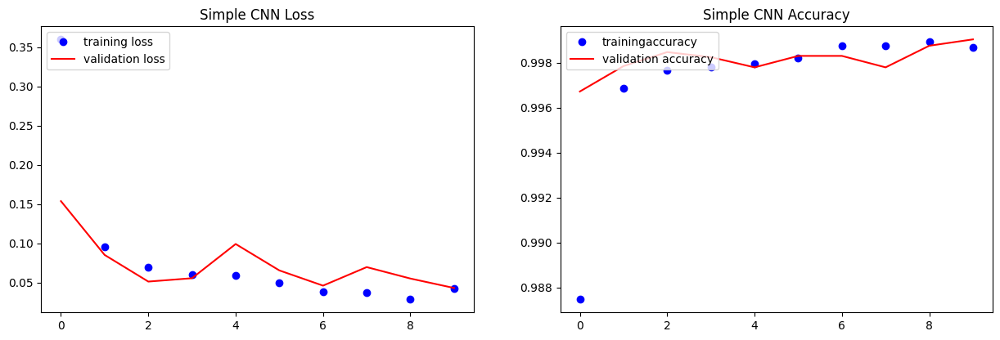

In [8]:
plt.figure(figsize=(15,10))
plt.subplot(221)
plt.plot(train_losses_his, 'bo', label = 'training loss')
plt.plot(valid_losses_his, 'r', label = 'validation loss')
plt.title("Simple CNN Loss")
plt.legend(loc='upper left')
plt.subplot(222)
plt.plot(train_acc_his, 'bo', label = 'trainingaccuracy')
plt.plot(valid_acc_his, 'r', label = 'validation accuracy')
plt.title("Simple CNN Accuracy")
plt.legend(loc='upper left')
plt.show()
torch.save(model1, "save/model")
# model1 = torch.load('save/model')